In [13]:
! pip install -r ../requirements.txt

Defaulting to user installation because normal site-packages is not writeable
  Using cached argparse-1.4.0-py2.py3-none-any.whl.metadata (2.8 kB)
  Using cached Shimmy-2.0.0-py3-none-any.whl.metadata (3.5 kB)
  Using cached gymnasium-1.1.1-py3-none-any.whl.metadata (9.4 kB)
  Using cached dm_control-1.0.28-py3-none-any.whl.metadata (1.6 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 965.4/965.4 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.4/56.4 MB 1.4 MB/s eta 0:00:0000:0100:020m
Using cached argparse-1.4.0-py2.py3-none-any.whl (23 kB)
  Attempting uninstall: gymnasium
    Found existing installation: gymnasium 0.28.1
    Uninstalling gymnasium-0.28.1:
      Successfully uninstalled gymnasium-0.28.1
  Attempting uninstall: dm_control
    Found existing installation: dm_control 1.0.30
    Uninstalling dm_control-1.0.30:
      Successfully uninstalled dm_control-1.0.30
ERROR: pip's dependency resolver does not currently take into account all the packages that

# Eval Visualization of CartPole Balance 

Action space: Box(-1.0, 1.0, (1,), float64)
Observation space: Box(-inf, inf, (5,), float64)


/Users/lin1214/Library/Python/3.9/lib/python/site-packages/imageio/plugins/pillow.py:409: DeprecationWarning: The keyword `fps` is no longer supported. Use `duration`(in ms) instead, e.g. `fps=50` == `duration=20` (1000 * 1/50).
  warnings.warn(


GIF saved to ./demo.gif


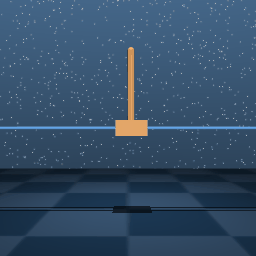

Evaluating: 100%|██████████| 100/100 [00:12<00:00,  7.75it/s]


Evaluation complete!
Average return over 100 episodes: 974.08 (std: 1.11)
Final score: 972.97

EXCELLENT! Beat PPO baseline
Grade: 30.00% out of 30%
🌟 CONGRATULATIONS! You got the MVP! 🌟


In [7]:
import argparse
import importlib
import numpy as np
from tqdm import tqdm
import sys
import os
from dmc import make_dmc_env

class Args:
    def __init__(self):
        self.episodes = 100
        self.record_demo = True

def load_agent(agent_path):
    """Dynamically load the student's agent class"""
    spec = importlib.util.spec_from_file_location("student_agent", agent_path)
    student_module = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(student_module)
    return student_module.Agent()

def make_env():
    # Create environment with image observations
    env_name = "cartpole-balance"
    env = make_dmc_env(env_name, np.random.randint(0, 1000000), flatten=True, use_pixels=False)
    return env

def record_video(env, agent):
    import imageio
    gif_path = f'./demo.gif'

    state, info = env.reset()
    frames = []

    while True:
        frame = env.render()
        frames.append(np.array(frame))
        action = agent.act(state)
        next_state, reward, terminated, truncated, _= env.step(action)
        state = next_state

        if terminated or truncated:
            break

    imageio.mimsave(gif_path, frames, fps=30)
    print(f'GIF saved to {gif_path}')

    from IPython.display import Image, display
    display(Image(gif_path))

def eval_score():
    """Evaluate the agent's performance on cartpole-balance with image observations"""

    args = Args()
    env = make_env()
    print(f"Action space: {env.action_space}")
    print(f"Observation space: {env.observation_space}")
    
    # Load student's agent
    agent = load_agent("student_agent.py")
    
    if args.record_demo:
        record_video(env, agent)

    # Run evaluation
    episode_rewards = []
    
    for episode in tqdm(range(args.episodes), desc="Evaluating"):
        observation, info = env.reset(seed=np.random.randint(0, 1000000))
        
        episode_reward = 0
        done = False
        step = 0
        
        while not done:
            
            # Get action from student's agent
            action = agent.act(observation)
            
            # Step the environment
            observation, reward, terminated, truncated, info = env.step(action)
            
            episode_reward += reward
            done = terminated or truncated
            step += 1
        
        episode_rewards.append(episode_reward)
    
    env.close()
    
    # Calculate final score
    mean = np.mean(episode_rewards)
    std = np.std(episode_rewards)
    print(f"\nEvaluation complete!")
    print(f"Average return over {args.episodes} episodes: {mean:.2f} (std: {std:.2f})")
    print(f"Final score: {mean - std:.2f}")
    
    return np.round(mean - std, 2)

if __name__ == "__main__":
    score = eval_score()
    # Define the baselines
    RANDOM_SCORE = 200
    PPO_SCORE = 950
    
    # Calculate grade percentage according to provided rules
    grade_percentage = 0
    
    if score >= PPO_SCORE:
        # Beat PPO baseline
        grade_percentage = 30
        result = "EXCELLENT! Beat PPO baseline"
    elif score >= RANDOM_SCORE:
        # Beat Random but not PPO
        # Normalize score between random and PPO
        normalized_score = (score - RANDOM_SCORE) / (PPO_SCORE - RANDOM_SCORE)
        grade_percentage = 10 + normalized_score * 20
        result = "GOOD! Beat Random baseline but not PPO"
    else:
        # Did not beat Random
        grade_percentage = 0
        result = "DID NOT meet the Random baseline"
    
    print(f"\n{result}")
    print(f"Grade: {grade_percentage:.2f}% out of 30%")
    if grade_percentage >= 30:
        print("\033[92m🌟 CONGRATULATIONS! You got the MVP! 🌟\033[0m")
    elif grade_percentage > 0:
        print(f"\033[93mYou earned {grade_percentage:.2f}% out of 30%.\033[0m")
    else:
        print("\033[91mUnfortunately, you did not pass the evaluation.\033[0m")
